

# 6Sense Take Home Task for Purchase prediction



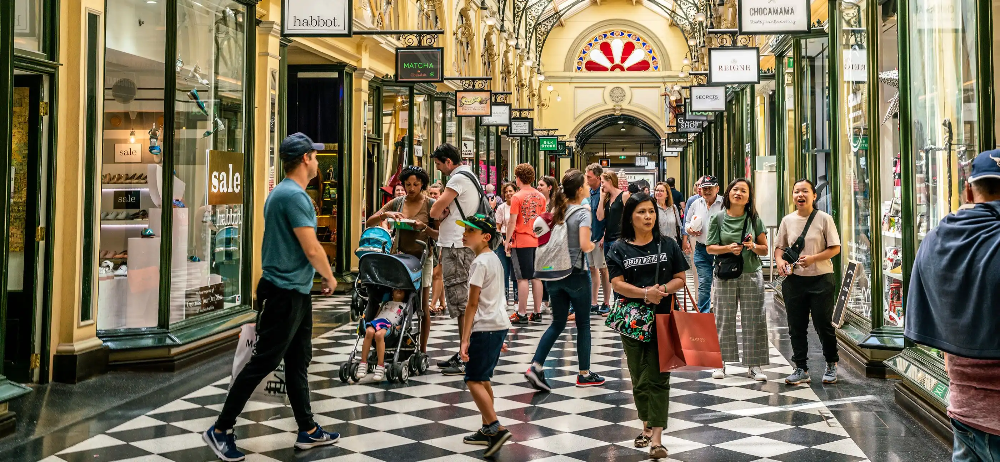

# **Import all the required packages and libraries**

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
import numpy as np
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.metrics import (confusion_matrix, 
                           accuracy_score,precision_recall_curve)
from sklearn.metrics import average_precision_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import metrics
import warnings

warnings.filterwarnings('ignore')
pd.set_option("display.max_columns", None)
sns.set(rc={'figure.figsize':(12,10)})

### Read the training dataset in the df dataframe and also rename the columns

In [ ]:
df = pd.read_csv('training.tsv', sep='\t',names=['user_id','activity_date','activity_type'])

**Checking the structure of data, missing data and datatypes of the data and making required for the processing**

In [ ]:
df.head()

,user_id,activity_date,activity_type
0,00002acbe042d69,2013-07-11,EmailOpen
1,00002acbe042d69,2013-07-11,FormSubmit
2,00002acbe042d69,2013-07-15,EmailOpen
3,00002acbe042d69,2013-07-17,EmailOpen
4,00002acbe042d69,2013-07-18,EmailOpen


In [ ]:
df.shape

(1542688, 3)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1542688 entries, 0 to 1542687
Data columns (total 3 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   user_id        1542688 non-null  object
 1   activity_date  1542688 non-null  object
 2   activity_type  1542687 non-null  object
dtypes: object(3)
memory usage: 35.3+ MB


In [ ]:
df.describe()

,user_id,activity_date,activity_type
count,1542688,1542688,1542687
unique,98836,672,7
top,2cd311cc3ef2d0c,2014-06-18,EmailOpen
freq,2718,15879,999684


In [ ]:
df.activity_date = pd.to_datetime(df.activity_date,errors='coerce')

**Checking for the missing data**

In [ ]:
df.isnull().sum()

user_id          0
activity_date    1
activity_type    1
dtype: int64

In [ ]:
df.dropna(axis=0)

,user_id,activity_date,activity_type
0,00002acbe042d69,2013-07-11,EmailOpen
1,00002acbe042d69,2013-07-11,FormSubmit
2,00002acbe042d69,2013-07-15,EmailOpen
3,00002acbe042d69,2013-07-17,EmailOpen
4,00002acbe042d69,2013-07-18,EmailOpen
...,...,...,...
1542682,4328c2c7e977c0b,2014-01-14,EmailOpen
1542683,4328c2c7e977c0b,2015-01-09,EmailOpen
1542684,4329050802b96c8,2014-09-20,FormSubmit
1542685,43291eba9ed32e4,2013-09-25,EmailOpen


**As there is only one missing data in activity date and activity_type and the data size is very large, so we will drop the missing data**

In [ ]:
df.isnull().sum()

user_id          0
activity_date    0
activity_type    0
dtype: int64

**Exploratory Data Analysis for checking the activity distribution**

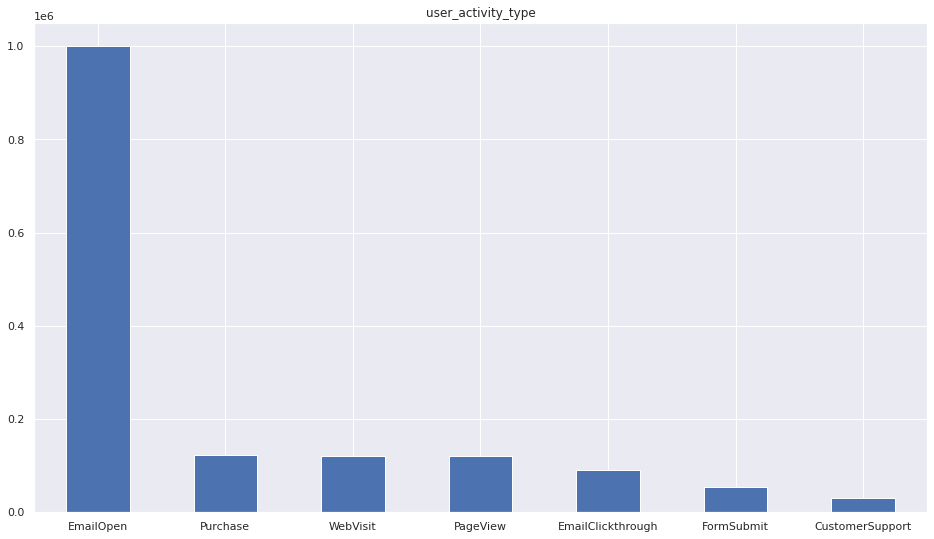

In [ ]:
df['activity_type'].value_counts().plot(kind='bar', title = 'user_activity_type', figsize=(16,9))
plt.xticks(rotation=0)
plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


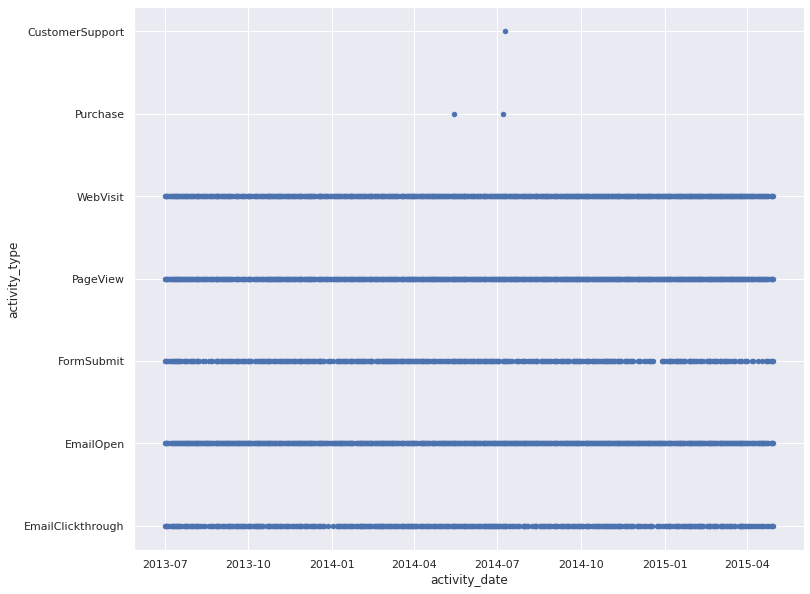

In [ ]:
df[df.user_id=='2cd311cc3ef2d0c'].plot.scatter(x='activity_date',y='activity_type')

In [ ]:
df[df.user_id=='0000ecf58c94668']

,user_id,activity_date,activity_type
30,0000ecf58c94668,2013-10-30,Purchase
31,0000ecf58c94668,2013-11-08,Purchase
32,0000ecf58c94668,2013-12-06,Purchase
33,0000ecf58c94668,2014-02-24,EmailClickthrough
34,0000ecf58c94668,2014-02-24,FormSubmit
35,0000ecf58c94668,2014-03-04,EmailOpen
36,0000ecf58c94668,2014-04-16,Purchase
37,0000ecf58c94668,2014-05-15,Purchase
38,0000ecf58c94668,2014-06-21,EmailOpen
39,0000ecf58c94668,2014-07-01,EmailOpen


In [ ]:
oldest_df=df.groupby('user_id')['activity_date'].min()

In [ ]:
df = df.merge(oldest_df,how='left',on='user_id',suffixes=['','_oldest'])


In [ ]:
df['activity_date']-df['activity_date_oldest']

0           0 days
1           0 days
2           4 days
3           6 days
4           7 days
            ...   
1542682     0 days
1542683   360 days
1542684     0 days
1542685     0 days
1542686   215 days
Length: 1542687, dtype: timedelta64[ns]

# **Feature Engineering**

#### Dropping CustomerSupport 

In [ ]:
df=df[df.activity_type!="CustomerSupport"]

#### Dropping if the purchase happends before any of the activity, which signify that there is no impact of the activity on the purchase made.

In [ ]:
other_oldest_df = df[df.activity_type!="Purchase"].groupby('user_id')['activity_date'].min()
other_act_df = df.merge(other_oldest_df, how='inner',on='user_id',suffixes=['','_oth'])

In [ ]:
no_prior_purchase_df =other_act_df[other_act_df.activity_date>=other_act_df.activity_date_oth]

In [ ]:
user_list = no_prior_purchase_df[no_prior_purchase_df.activity_type=='Purchase'].groupby('user_id').count().index[:10]

In [ ]:
user_act_df = no_prior_purchase_df.pivot_table(index='user_id',values='activity_date',columns='activity_type',aggfunc='count',fill_value=0).reset_index()

#### Initializing a new column p_flag which is like a prediction column if the purchase is made or not.

In [ ]:
user_act_df['p_flag']=user_act_df.Purchase.apply(lambda x:x if x==0 else 1)

In [ ]:
user_act_df.p_flag.sum()/user_act_df.shape[0]

0.14161425319987275

In [ ]:
user_act_df.describe()

activity_type,EmailClickthrough,EmailOpen,FormSubmit,PageView,Purchase,WebVisit,p_flag
count,81722.000000,81722.000000,81722.000000,81722.000000,81722.000000,81722.000000,81722.000000
mean,1.104317,12.232740,0.676391,1.484839,0.923741,1.490884,0.141614
std,5.110798,26.231956,3.555210,11.695860,5.684543,11.686866,0.348656
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,12.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,463.000000,630.000000,430.000000,596.000000,352.000000,596.000000,1.000000


In [ ]:
user_act_df.quantile([0,0.25,0.5,0.75,0.9,0.99,0.995,1])

activity_type,EmailClickthrough,EmailOpen,FormSubmit,PageView,Purchase,WebVisit,p_flag
0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0
0.250,0.000,1.000,0.0,0.0,0.0,0.0,0.0
0.500,0.000,4.000,0.0,0.0,0.0,0.0,0.0
0.750,1.000,12.000,1.0,0.0,0.0,0.0,0.0
0.900,2.000,29.000,1.0,1.0,1.0,1.0,1.0
0.990,16.000,129.000,9.0,35.0,18.0,35.0,1.0
0.995,26.395,171.395,14.0,66.0,29.0,66.0,1.0
1.000,463.000,630.000,430.0,596.0,352.0,596.0,1.0


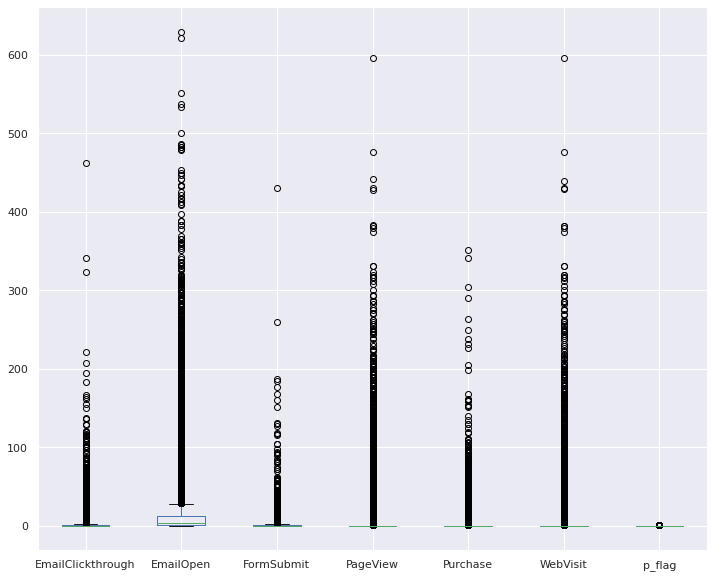

In [ ]:
user_act_df.plot.box()

In [ ]:
user_act_df.columns


Index(['user_id', 'EmailClickthrough', 'EmailOpen', 'FormSubmit', 'PageView',
       'Purchase', 'WebVisit', 'p_flag'],
      dtype='object', name='activity_type')

In [ ]:
user_act_no_ol_df = user_act_df[(user_act_df['EmailClickthrough']<=25) &
                                 (user_act_df['EmailOpen']<=167) &
                                 (user_act_df['FormSubmit']<=14) &
                                 (user_act_df['PageView']<=64) &
                                 (user_act_df['WebVisit']<=64)]

In [ ]:
user_act_no_ol_df.p_flag.sum()/user_act_df.shape[0]

0.13299968184821712

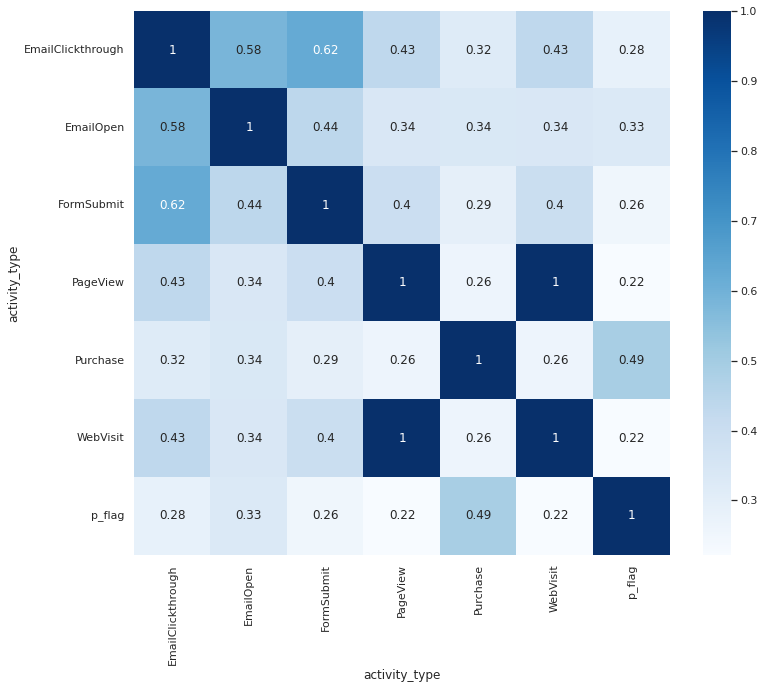

In [ ]:
sns.heatmap(user_act_no_ol_df.corr(), cmap="Blues", annot=True)

#### WebVisit & PageView have very high correlation

In [ ]:
user_act_no_ol_df.PageView.corr(user_act_no_ol_df.WebVisit)


0.999299981405948

In [ ]:
user_act_no_ol_df=user_act_no_ol_df.drop(['WebVisit'],axis=1)

# **Model Buidling**

In [ ]:
X=user_act_no_ol_df.drop(['Purchase','p_flag','user_id'],axis=1)
y=user_act_no_ol_df['p_flag']

In [ ]:
X.columns

Index(['EmailClickthrough', 'EmailOpen', 'FormSubmit', 'PageView'], dtype='object', name='activity_type')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [ ]:
X_train

activity_type,EmailClickthrough,EmailOpen,FormSubmit,PageView
27774,0,1,0,0
11122,5,122,2,3
33354,0,2,0,0
68594,0,0,1,0
60939,0,2,0,0
...,...,...,...,...
66369,0,5,0,0
78566,1,3,1,1
80612,1,10,0,0
56735,3,11,1,2


In [ ]:
model = LogisticRegression()

In [ ]:
model.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

# **Model Performance**

In [ ]:
predicted = model.predict(X_test)

In [ ]:
print(metrics.classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.88      0.99      0.93     20976
           1       0.64      0.14      0.23      3260

    accuracy                           0.87     24236
   macro avg       0.76      0.56      0.58     24236
weighted avg       0.85      0.87      0.84     24236



In [ ]:
logm2 = sm.Logit(y_train,(sm.add_constant(X_train)))
logm2=logm2.fit()
logm2.summary()

Optimization terminated successfully.
         Current function value: 0.347186
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 p_flag   No. Observations:                56550
Model:                          Logit   Df Residuals:                    56545
Method:                           MLE   Df Model:                            4
Date:                Sun, 17 Oct 2021   Pseudo R-squ.:                  0.1209
Time:                        07:12:56   Log-Likelihood:                -19633.
converged:                       True   LL-Null:                       -22335.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -2.4641      0.017   -145.589      0.000      -2.497      -2.431
EmailClickthrough     0.0665      0.008      8.697      0.000       0.051       0.081
EmailOpen             0.0280      0.001     37.392      0.000       0.027       0.030
FormSubmit            0.1598      0.013     12.498      0.000       0.135       0.185
PageView              0.0441      0.003     13.076      0.000       0.038       0.051
=====================================================================================
"""

In [ ]:
y_hat_train = logm2.predict(sm.add_constant(X_train))

In [ ]:
prediction = list(map(round, y_hat_train))


In [ ]:
cm = confusion_matrix(y_train, prediction) 
print ("Confusion Matrix : \n", cm) 
  
# accuracy score of the model
print('Train accuracy = ', accuracy_score(y_train, prediction))

Confusion Matrix : 
 [[48307   634]
 [ 6445  1164]]
Train accuracy =  0.8748187444739169


#### Testing the performance on test dataset

In [ ]:
y_hat_test = logm2.predict(sm.add_constant(X_test[X_train.columns]))

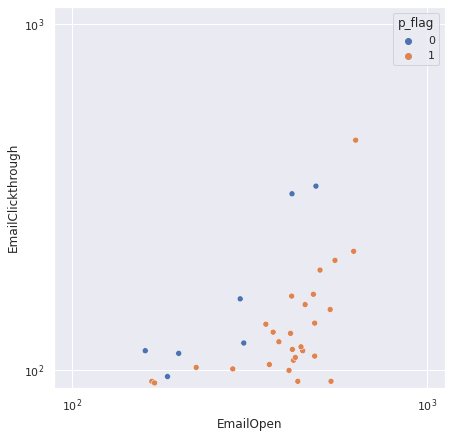

In [ ]:
f, ax = plt.subplots(figsize=(7, 7))
ax.set(xscale="log", yscale="log")
sns.scatterplot(data=user_act_df, x='EmailOpen',y='EmailClickthrough',hue='p_flag',ax=ax)

In [ ]:
yhat = logm2.predict(sm.add_constant(X_test[X_train.columns]))


In [ ]:
prediction = list(map(round, yhat))


In [ ]:
cm = confusion_matrix(y_test, prediction) 
print ("Confusion Matrix : \n", cm) 
  
# accuracy score of the model
print('Test accuracy = ', accuracy_score(y_test, prediction))

Confusion Matrix : 
 [[20717   259]
 [ 2801   459]]
Test accuracy =  0.8737415415084997


### Prediction

In [ ]:
tdf = pd.read_csv('test.tsv', sep='\t',names=['user_id','activity_date','activity_type'])

In [ ]:
tdf_t = tdf.pivot_table(index='user_id',values='activity_date',columns='activity_type',aggfunc='count',fill_value=0).reset_index()

In [ ]:
tdf_t

activity_type,user_id,EmailClickthrough,EmailOpen,FormSubmit,PageView,WebVisit
0,0000ecf58c94668,0,5,0,0,0
1,000132f21724ee2,1,1,0,0,0
2,0001b315b991cf0,0,3,0,0,0
3,000269150971d08,0,4,0,0,0
4,000297ba4fa5026,0,3,0,0,0
...,...,...,...,...,...,...
132805,fffc7f2ad169c6b,0,1,0,0,0
132806,fffd77a0266d37c,0,3,1,1,1
132807,fffed482b52afd8,0,1,0,0,0
132808,ffffa4cc0190881,0,1,0,0,0


In [ ]:
test_X = tdf_t[X_train.columns]

In [ ]:
tdf.user_id.unique().shape

(132810,)

In [ ]:
test_y_hat = logm2.predict(sm.add_constant(test_X))

In [ ]:
purchase_1000 = tdf_t.iloc[test_y_hat.sort_values(ascending=False)[:1000].index,0]

In [ ]:
purchase_1000.to_csv('top1000.csv', index=False)

# Answers to the questions asked 


1. How did you approach the time-based aspect of the problem?
Ans- I covered the time based problem by firstly converting the datatype of activity_date column to date time datatype and then checking the activity_type distribution compared to activity date from where we can get some time based distribution, if it is there, but no as such found in this case. The checking the difference between the first activity and the last activity. 

2. Describe which activity types you believe are most useful in predicting which user will purchase in the future.
Ans- From the above chunk information the activity types which are most useful for predicting which user will purchase in future are 
FormSubmit
*   FormSubmit
*   EmailClickThrough
*   PageView


3. If you had more time, what else would you do?
If I had more time I would have work on bucketing these numbers and do some further analysis to get some more results on the pattern of purchase and try predicting the model with the help of other models like Neural Network.